# Imports

In [1]:
import torch
import numpy as np
from torchvision import transforms
from PIL import Image as PilImage
from matplotlib import pyplot as plt

from omnixai.preprocessing.image import Resize
from omnixai.data.image import Image
from omnixai.explainers.vision import VisionExplainer
from omnixai.visualization.dashboard import Dashboard
from omnixai.explainers.vision.specific.gradcam.pytorch.gradcam import GradCAM

from Exp.model import ResNet18, Vgg16

2023-05-02 09:15:21.555405: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-02 09:15:22.818456: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/vuong.nguyen/.conda/envs/tf/lib/python3.9/site-packages/cv2/../../lib64:/usr/local/cudnn/11.2-v8.1.0/cuda/lib64:/usr/local/cuda-11.2/lib64:/home/vuong.nguyen/.conda/envs/tf/lib/:/home/vuong.nguyen/.conda/envs/tf/lib/python3.9/site-packages/nvidia/cudnn/lib
2023-05-02 09:15:22.818579: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'l

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# Get bacth blue images

## Origin

In [3]:
hw_origin_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/Origin"
rv_origin_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/Origin"

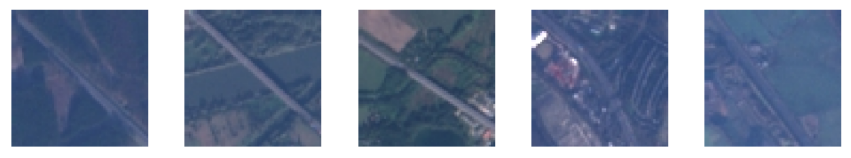

In [4]:
plt.rcParams["figure.figsize"] = [15, 6]
hw_origin = []
for id in range(5):
  plt.subplot(1, 5, id+1)
  img = PilImage.open(f"{hw_origin_path}/hw_{id+1}.png").convert('RGB')
  plt.imshow(img)
  plt.axis('off')
  new_img = Image(img)
  hw_origin.append(new_img.to_numpy())

In [5]:
hw_origin = np.stack(hw_origin, axis=1).squeeze()

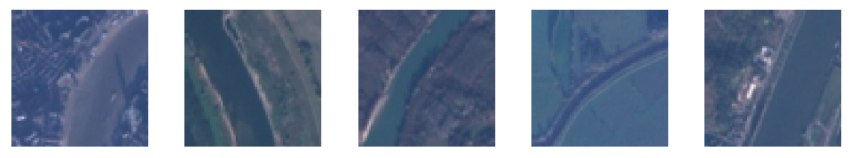

In [6]:
plt.rcParams["figure.figsize"] = [15, 6]
rv_origin = []
for id in range(5):
  plt.subplot(1, 5, id+1)
  img = PilImage.open(f"{rv_origin_path}/rv_{id+1}.png").convert('RGB')
  plt.imshow(img)
  plt.axis('off')
  new_img = Image(img)
  rv_origin.append(new_img.to_numpy())

In [7]:
rv_origin = np.stack(rv_origin, axis=1).squeeze()

## NST

In [8]:
hw_nst_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/NST"
rv_nst_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/NST"

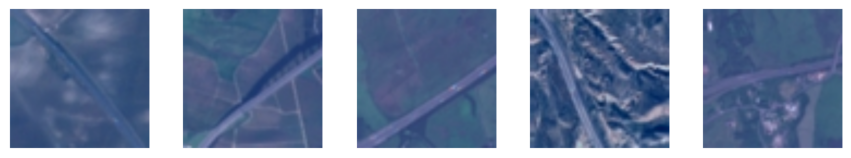

In [9]:
plt.rcParams["figure.figsize"] = [15, 6]
hw_nst = []
for id in range(5):
  plt.subplot(1, 5, id+1)
  img = PilImage.open(f"{hw_nst_path}/hw_{id+1}.png").convert('RGB')
  plt.imshow(img)
  plt.axis('off')
  new_img = Image(img)
  hw_nst.append(new_img.to_numpy())

In [10]:
hw_nst = np.stack(hw_nst, axis=1).squeeze()

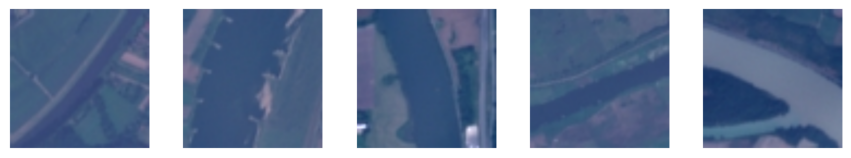

In [11]:
plt.rcParams["figure.figsize"] = [15, 6]
rv_nst = []
for id in range(5):
  plt.subplot(1, 5, id+1)
  img = PilImage.open(f"{rv_nst_path}/rv_{id+1}.png").convert('RGB')
  plt.imshow(img)
  plt.axis('off')
  new_img = Image(img)
  rv_nst.append(new_img.to_numpy())

In [12]:
rv_nst = np.stack(rv_nst, axis=1).squeeze()

## GAN_NST

In [13]:
hw_gan_nst_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/GAN_NST"
rv_gan_nst_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/GAN_NST"

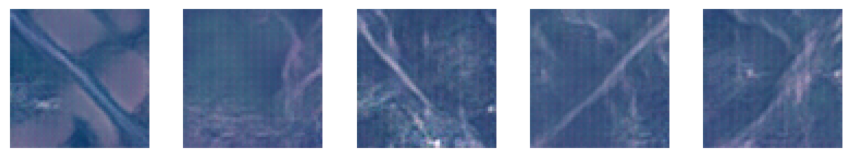

In [14]:
plt.rcParams["figure.figsize"] = [15, 6]
hw_gan_nst = []
for id in range(5):
  plt.subplot(1, 5, id+1)
  img = PilImage.open(f"{hw_gan_nst_path}/hw_{id+1}.png").convert('RGB')
  plt.imshow(img)
  plt.axis('off')
  new_img = Image(img)
  hw_gan_nst.append(new_img.to_numpy())

In [15]:
hw_gan_nst = np.stack(hw_gan_nst, axis=1).squeeze()

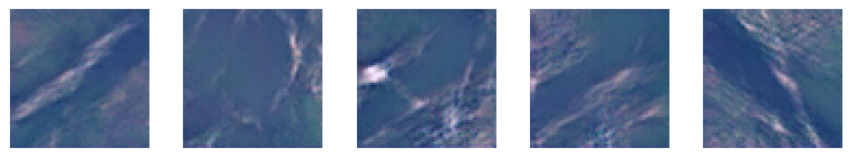

In [16]:
plt.rcParams["figure.figsize"] = [15, 6]
rv_gan_nst = []
for id in range(5):
  plt.subplot(1, 5, id+1)
  img = PilImage.open(f"{rv_gan_nst_path}/rv_{id+1}.png").convert('RGB')
  plt.imshow(img)
  plt.axis('off')
  new_img = Image(img)
  rv_gan_nst.append(new_img.to_numpy())

In [17]:
rv_gan_nst = np.stack(rv_gan_nst, axis=1).squeeze()

# ResNet18

In [18]:
baseline_resnet18_model_1 = ResNet18(2)
baseline_resnet18_model_1.load_state_dict(torch.load(f"Exp/Output_ResNet18/Baseline/xai_checkpoint_baseline1.pt"))

baseline_resnet18_model_2 = ResNet18(2)
baseline_resnet18_model_2.load_state_dict(torch.load(f"Exp/Output_ResNet18/Baseline/xai_checkpoint_baseline2.pt"))

<All keys matched successfully>

In [19]:
fda_resnet18_model_1 = ResNet18(2)
fda_resnet18_model_1.load_state_dict(torch.load(f"Exp/Output_ResNet18/FDA/Aug/xai_checkpoint_augmentation_1.pt"))

fda_resnet18_model_2 = ResNet18(2)
fda_resnet18_model_2.load_state_dict(torch.load(f"Exp/Output_ResNet18/FDA/Aug/xai_checkpoint_augmentation_2.pt"))

<All keys matched successfully>

In [20]:
flow_resnet18_model_1 = ResNet18(2)
flow_resnet18_model_1.load_state_dict(torch.load(f"Exp/Output_ResNet18/Flow/Aug/xai_checkpoint_augmentation_1.pt"))

flow_resnet18_model_2 = ResNet18(2)
flow_resnet18_model_2.load_state_dict(torch.load(f"Exp/Output_ResNet18/Flow/Aug/xai_checkpoint_augmentation_2.pt"))

<All keys matched successfully>

In [21]:
ccpl_resnet18_model_1 = ResNet18(2)
ccpl_resnet18_model_1.load_state_dict(torch.load(f"Exp/Output_ResNet18/CCPL/Aug/xai_checkpoint_augmentation_1.pt"))

ccpl_resnet18_model_2 = ResNet18(2)
ccpl_resnet18_model_2.load_state_dict(torch.load(f"Exp/Output_ResNet18/CCPL/Aug/xai_checkpoint_augmentation_2.pt"))

<All keys matched successfully>

In [22]:
dcgan_fda_resnet18_model_1 = ResNet18(2)
dcgan_fda_resnet18_model_1.load_state_dict(torch.load(f"Exp/Output_ResNet18/DCGAN_FDA/Aug/xai_checkpoint_augmentation_1.pt"))

dcgan_fda_resnet18_model_2 = ResNet18(2)
dcgan_fda_resnet18_model_2.load_state_dict(torch.load(f"Exp/Output_ResNet18/DCGAN_FDA/Aug/xai_checkpoint_augmentation_2.pt"))

<All keys matched successfully>

In [23]:
dcgan_flow_resnet18_model_1 = ResNet18(2)
dcgan_flow_resnet18_model_1.load_state_dict(torch.load(f"Exp/Output_ResNet18/DCGAN_Flow/Aug/xai_checkpoint_augmentation_1.pt"))

dcgan_flow_resnet18_model_2 = ResNet18(2)
dcgan_flow_resnet18_model_2.load_state_dict(torch.load(f"Exp/Output_ResNet18/DCGAN_Flow/Aug/xai_checkpoint_augmentation_2.pt"))

<All keys matched successfully>

# Explainable AI

In [24]:
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.ToTensor()
])

preprocess = lambda ims: torch.stack([transform(im.to_pil()) for im in ims])

postprocess = lambda logits: torch.nn.functional.softmax(logits, dim=1)

In [25]:
hw_origin = Image(
    data=hw_origin,
    batched=True
)

rv_origin = Image(
    data=rv_origin,
    batched=True
)

In [26]:
hw_nst = Image(
    data=hw_nst,
    batched=True
)

rv_nst = Image(
    data=rv_nst,
    batched=True
)

In [27]:
hw_gan_nst = Image(
    data=hw_gan_nst,
    batched=True
)

rv_gan_nst = Image(
    data=rv_gan_nst,
    batched=True
)

## Highway

### Origin

In [28]:
hw_resnet18_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/Origin/ResNet18"

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


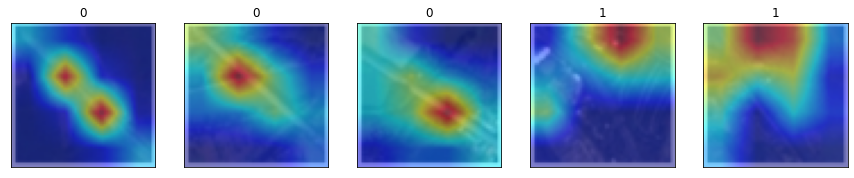

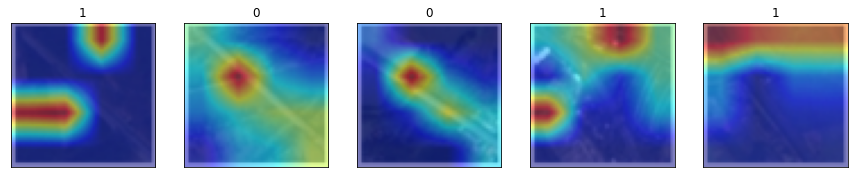

In [29]:
explainer = GradCAM(
    model=baseline_resnet18_model_1,
    target_layer=baseline_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess,
    mode="classification"
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_1.png")

explainer = GradCAM(
    model=baseline_resnet18_model_2,
    target_layer=baseline_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_2.png")

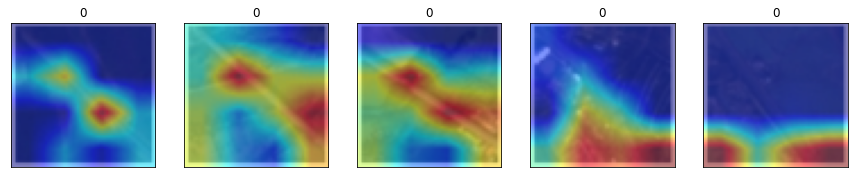

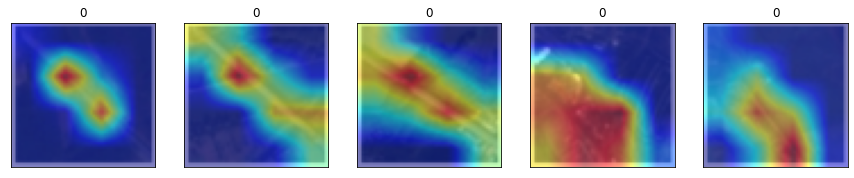

In [30]:
explainer = GradCAM(
    model=fda_resnet18_model_1,
    target_layer=fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_3.png")

explainer = GradCAM(
    model=fda_resnet18_model_2,
    target_layer=fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_4.png")

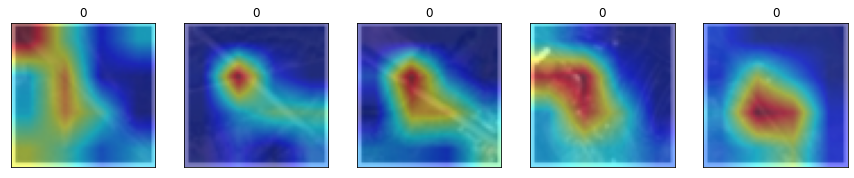

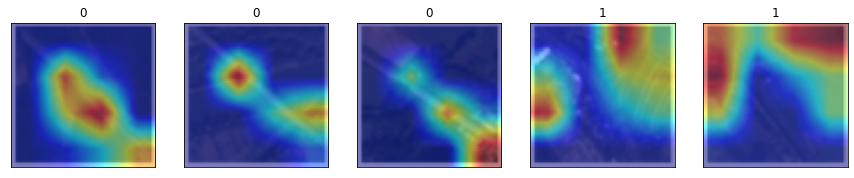

In [31]:
explainer = GradCAM(
    model=flow_resnet18_model_1,
    target_layer=flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_5.png")

explainer = GradCAM(
    model=flow_resnet18_model_2,
    target_layer=flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_6.png")

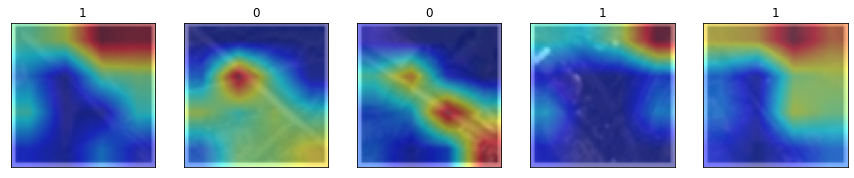

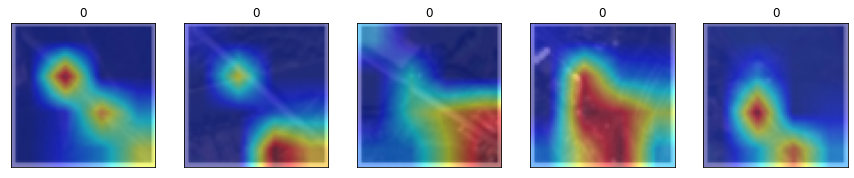

In [32]:
explainer = GradCAM(
    model=ccpl_resnet18_model_1,
    target_layer=ccpl_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_7.png")

explainer = GradCAM(
    model=ccpl_resnet18_model_2,
    target_layer=ccpl_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_8.png")

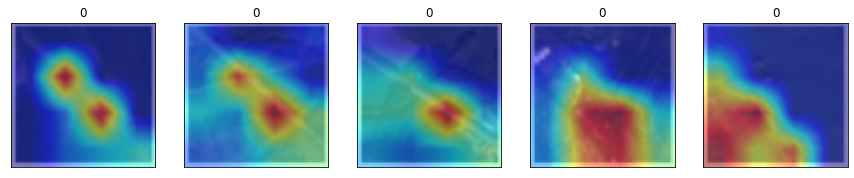

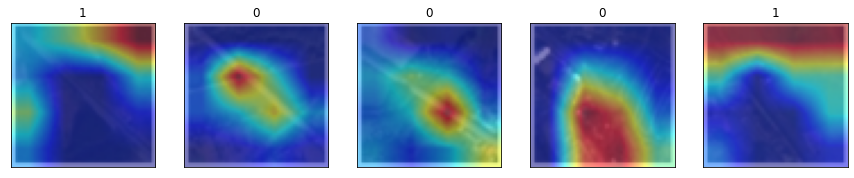

In [33]:
explainer = GradCAM(
    model=dcgan_fda_resnet18_model_1,
    target_layer=dcgan_fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_9.png")

explainer = GradCAM(
    model=dcgan_fda_resnet18_model_2,
    target_layer=dcgan_fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_10.png")

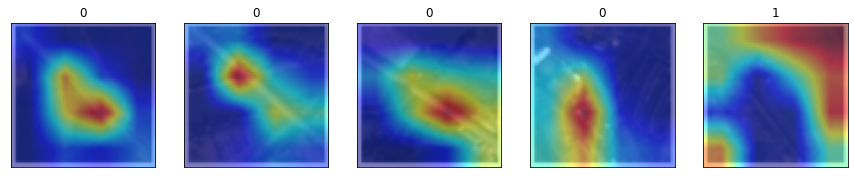

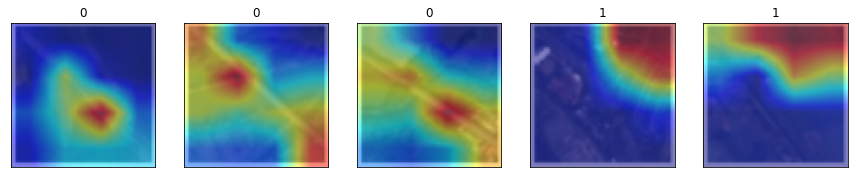

In [34]:
explainer = GradCAM(
    model=dcgan_flow_resnet18_model_1,
    target_layer=dcgan_flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_11.png")

explainer = GradCAM(
    model=dcgan_flow_resnet18_model_2,
    target_layer=dcgan_flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_origin)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_12.png")

### NST

In [35]:
hw_resnet18_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/NST/ResNet18"

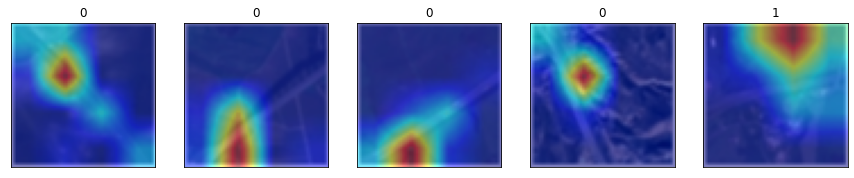

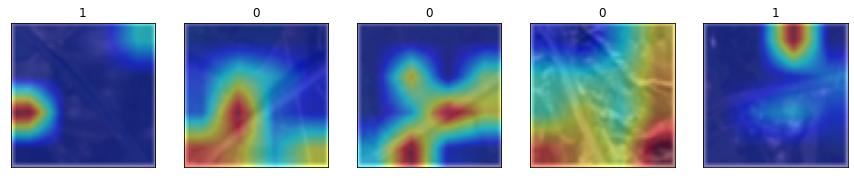

In [36]:
explainer = GradCAM(
    model=baseline_resnet18_model_1,
    target_layer=baseline_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_1.png")

explainer = GradCAM(
    model=baseline_resnet18_model_2,
    target_layer=baseline_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_2.png")

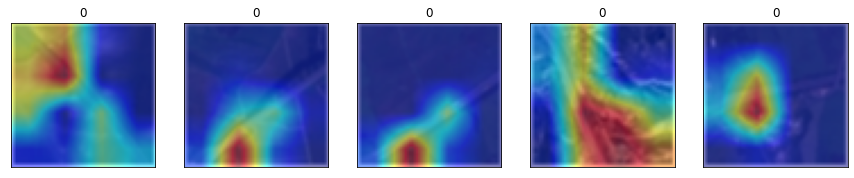

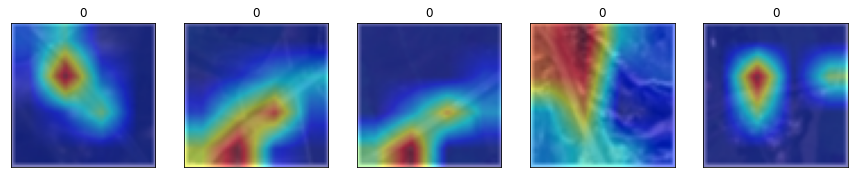

In [37]:
explainer = GradCAM(
    model=fda_resnet18_model_1,
    target_layer=fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_3.png")

explainer = GradCAM(
    model=fda_resnet18_model_2,
    target_layer=fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_4.png")

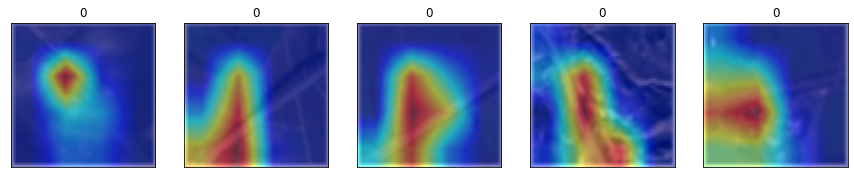

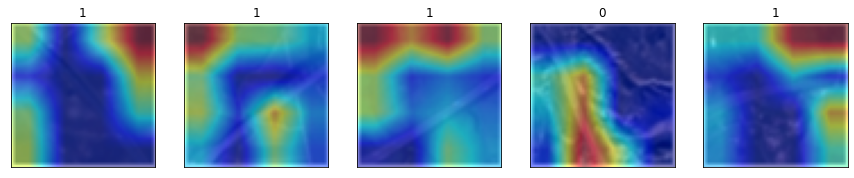

In [38]:
explainer = GradCAM(
    model=flow_resnet18_model_1,
    target_layer=flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_5.png")

explainer = GradCAM(
    model=flow_resnet18_model_2,
    target_layer=flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_6.png")

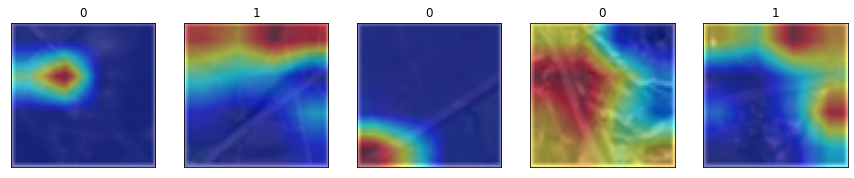

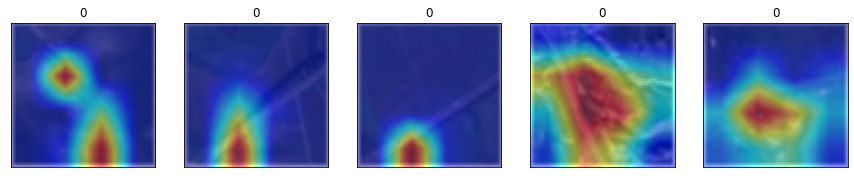

In [39]:
explainer = GradCAM(
    model=ccpl_resnet18_model_1,
    target_layer=ccpl_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_7.png")

explainer = GradCAM(
    model=ccpl_resnet18_model_2,
    target_layer=ccpl_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_8.png")

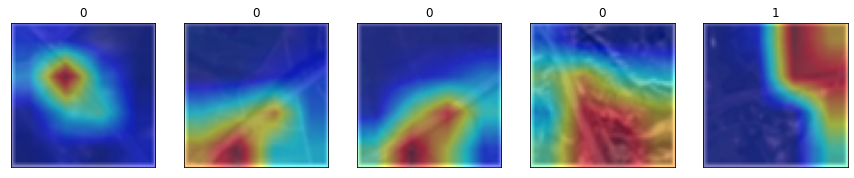

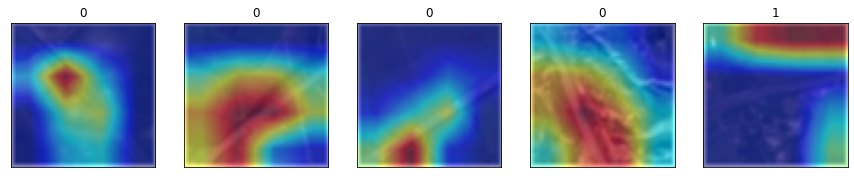

In [40]:
explainer = GradCAM(
    model=dcgan_fda_resnet18_model_1,
    target_layer=dcgan_fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_9.png")

explainer = GradCAM(
    model=dcgan_fda_resnet18_model_2,
    target_layer=dcgan_fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_10.png")

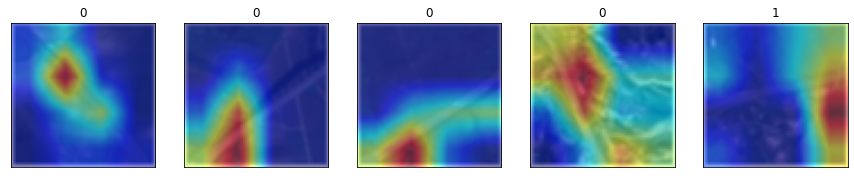

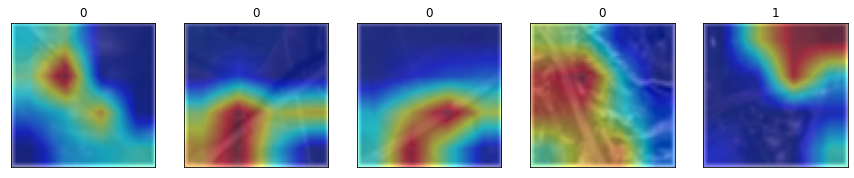

In [41]:
explainer = GradCAM(
    model=dcgan_flow_resnet18_model_1,
    target_layer=dcgan_flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_11.png")

explainer = GradCAM(
    model=dcgan_flow_resnet18_model_2,
    target_layer=dcgan_flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_12.png")

### GAN + NST

In [42]:
hw_resnet18_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/GAN_NST/ResNet18"

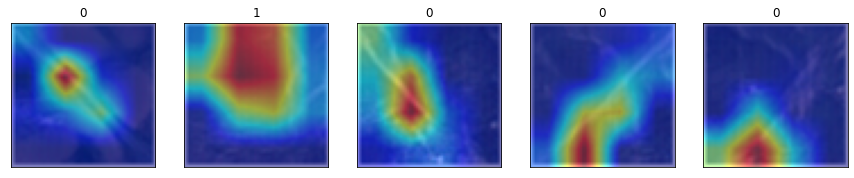

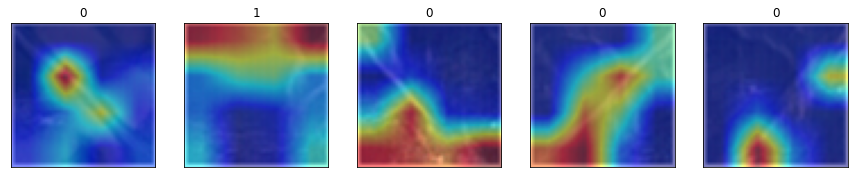

In [43]:
explainer = GradCAM(
    model=baseline_resnet18_model_1,
    target_layer=baseline_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_1.png")

explainer = GradCAM(
    model=baseline_resnet18_model_2,
    target_layer=baseline_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_2.png")

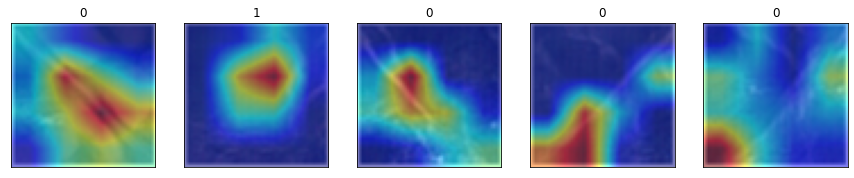

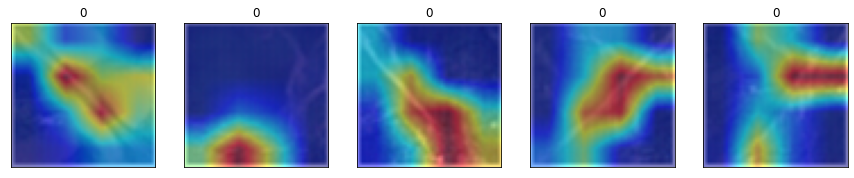

In [44]:
explainer = GradCAM(
    model=fda_resnet18_model_1,
    target_layer=fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_3.png")

explainer = GradCAM(
    model=fda_resnet18_model_2,
    target_layer=fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_4.png")

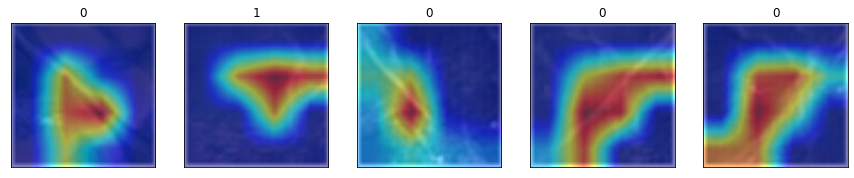

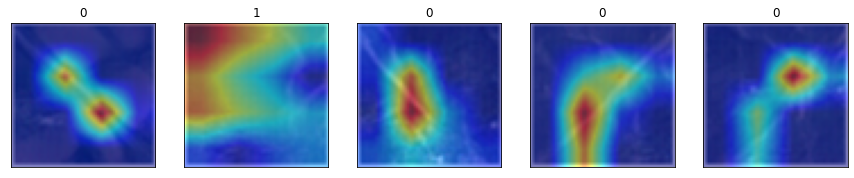

In [45]:
explainer = GradCAM(
    model=flow_resnet18_model_1,
    target_layer=flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_5.png")

explainer = GradCAM(
    model=flow_resnet18_model_2,
    target_layer=flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_6.png")

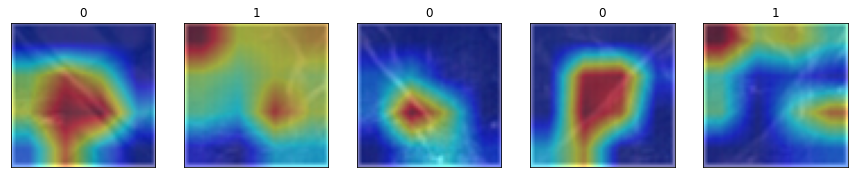

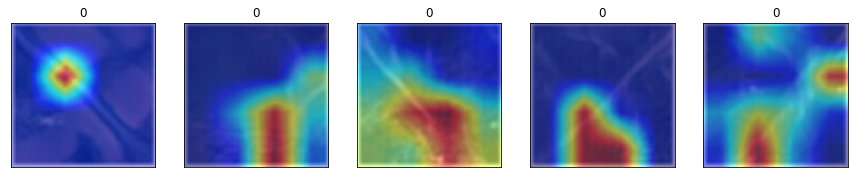

In [46]:
explainer = GradCAM(
    model=ccpl_resnet18_model_1,
    target_layer=ccpl_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_7.png")

explainer = GradCAM(
    model=ccpl_resnet18_model_2,
    target_layer=ccpl_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_8.png")

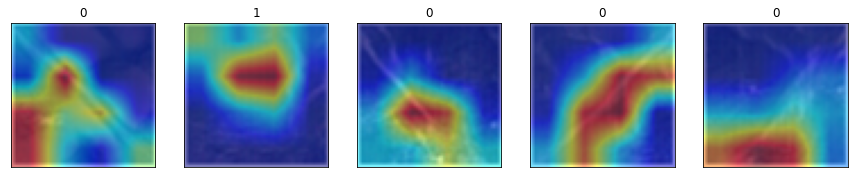

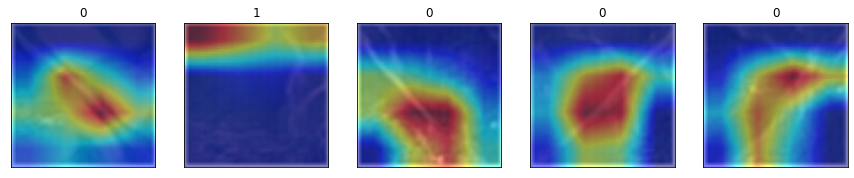

In [47]:
explainer = GradCAM(
    model=dcgan_fda_resnet18_model_1,
    target_layer=dcgan_fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_9.png")

explainer = GradCAM(
    model=dcgan_fda_resnet18_model_2,
    target_layer=dcgan_fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_10.png")

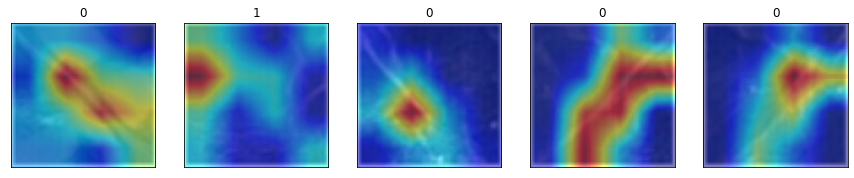

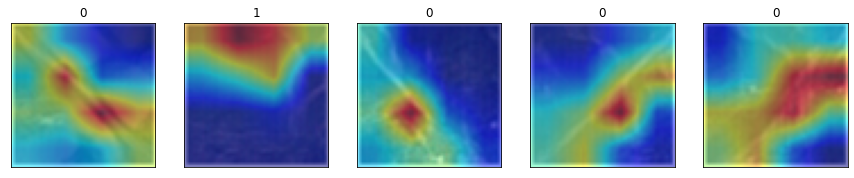

In [48]:
explainer = GradCAM(
    model=dcgan_flow_resnet18_model_1,
    target_layer=dcgan_flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_11.png")

explainer = GradCAM(
    model=dcgan_flow_resnet18_model_2,
    target_layer=dcgan_flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(hw_gan_nst)
explanations.plot(save_path=f"{hw_resnet18_path}/GradCAM/res_12.png")

## River

### Origin

In [49]:
rv_resnet18_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/Origin/ResNet18"

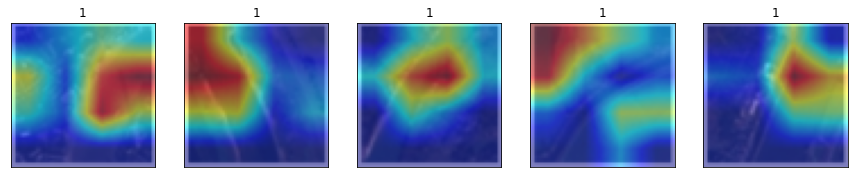

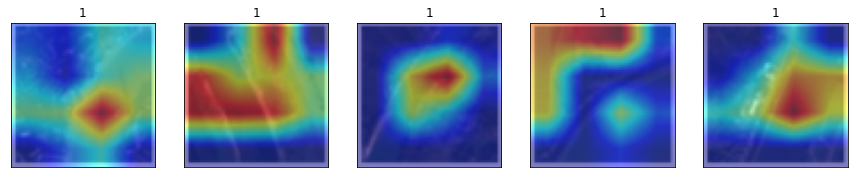

In [50]:
explainer = GradCAM(
    model=baseline_resnet18_model_1,
    target_layer=baseline_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_1.png")

explainer = GradCAM(
    model=baseline_resnet18_model_2,
    target_layer=baseline_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_2.png")

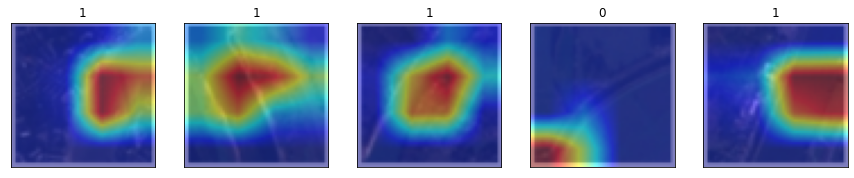

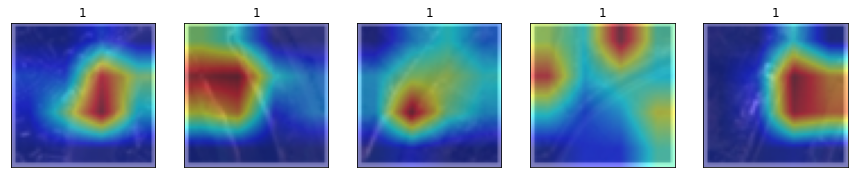

In [51]:
explainer = GradCAM(
    model=fda_resnet18_model_1,
    target_layer=fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_3.png")

explainer = GradCAM(
    model=fda_resnet18_model_2,
    target_layer=fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_4.png")

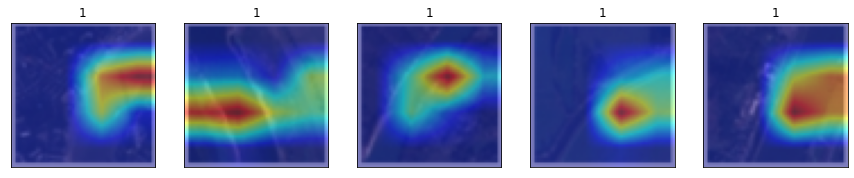

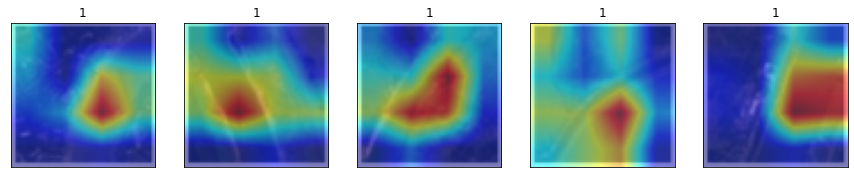

In [52]:
explainer = GradCAM(
    model=flow_resnet18_model_1,
    target_layer=flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_5.png")

explainer = GradCAM(
    model=flow_resnet18_model_2,
    target_layer=flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_6.png")

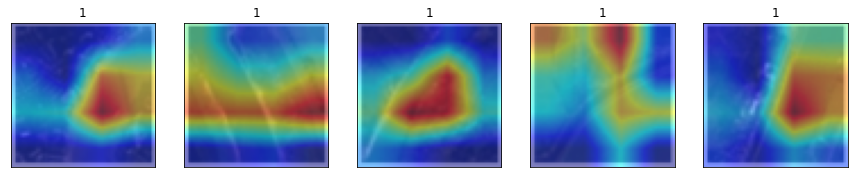

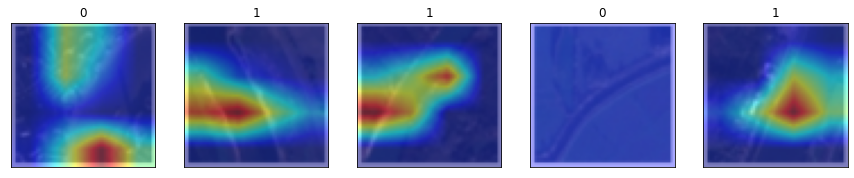

In [53]:
explainer = GradCAM(
    model=ccpl_resnet18_model_1,
    target_layer=ccpl_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_7.png")

explainer = GradCAM(
    model=ccpl_resnet18_model_2,
    target_layer=ccpl_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_8.png")

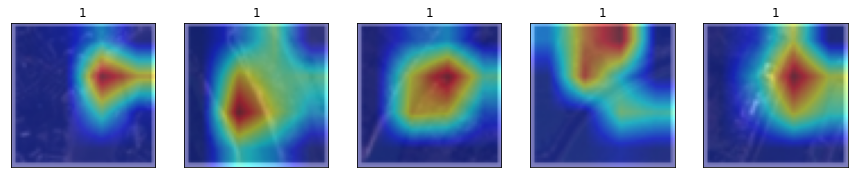

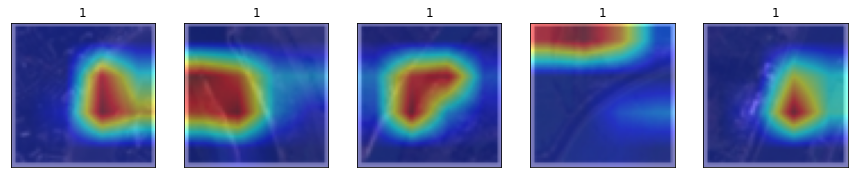

In [54]:
explainer = GradCAM(
    model=dcgan_fda_resnet18_model_1,
    target_layer=dcgan_fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_9.png")

explainer = GradCAM(
    model=dcgan_fda_resnet18_model_2,
    target_layer=dcgan_fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_10.png")

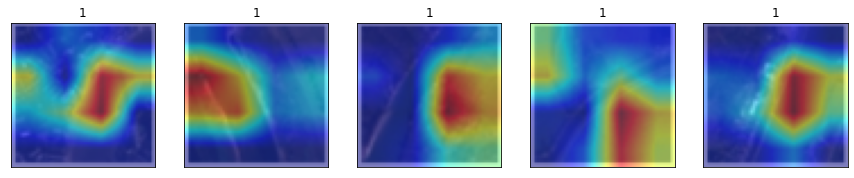

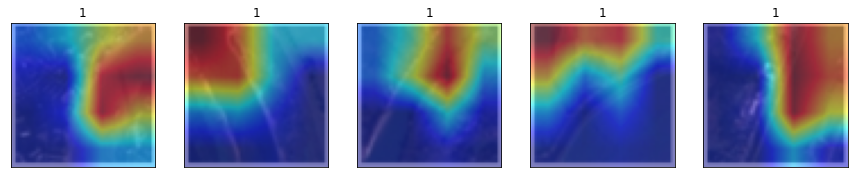

In [55]:
explainer = GradCAM(
    model=dcgan_flow_resnet18_model_1,
    target_layer=dcgan_flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_11.png")

explainer = GradCAM(
    model=dcgan_flow_resnet18_model_2,
    target_layer=dcgan_flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_origin)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_12.png")

### NST

In [56]:
rv_resnet18_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/NST/ResNet18"

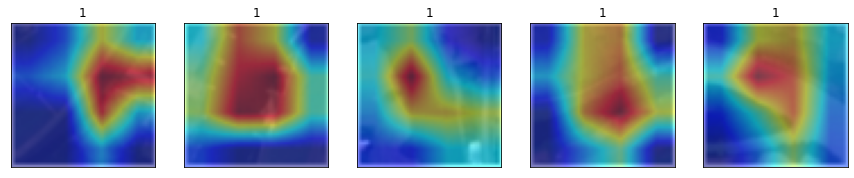

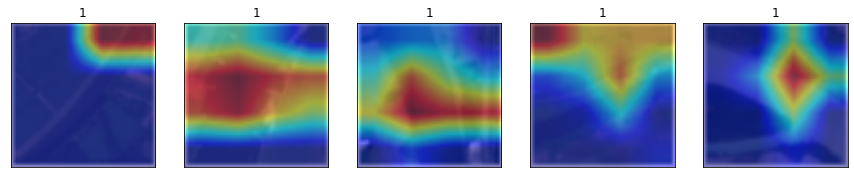

In [57]:
explainer = GradCAM(
    model=baseline_resnet18_model_1,
    target_layer=baseline_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_1.png")

explainer = GradCAM(
    model=baseline_resnet18_model_2,
    target_layer=baseline_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_2.png")

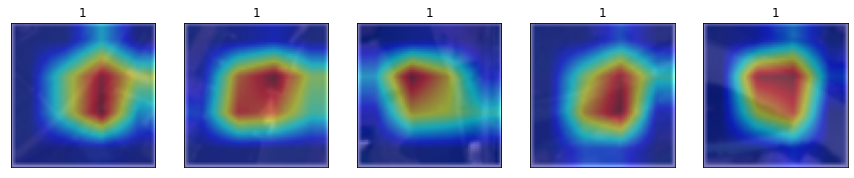

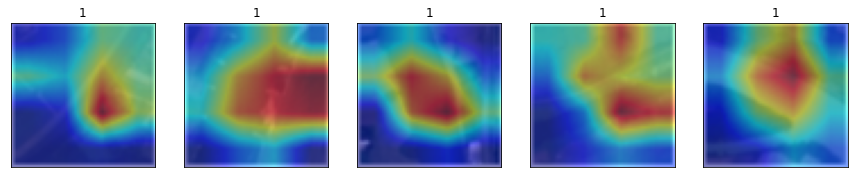

In [58]:
explainer = GradCAM(
    model=fda_resnet18_model_1,
    target_layer=fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_3.png")

explainer = GradCAM(
    model=fda_resnet18_model_2,
    target_layer=fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_4.png")

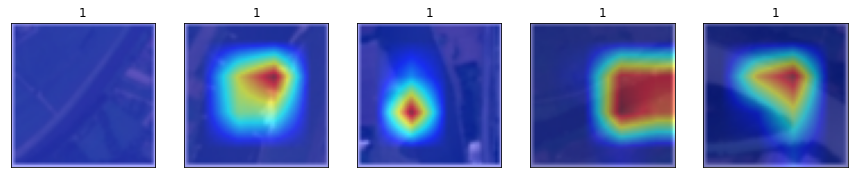

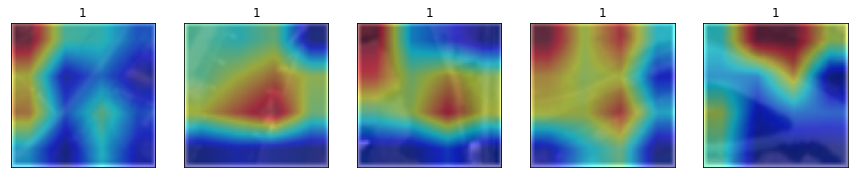

In [59]:
explainer = GradCAM(
    model=flow_resnet18_model_1,
    target_layer=flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_5.png")

explainer = GradCAM(
    model=flow_resnet18_model_2,
    target_layer=flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_6.png")

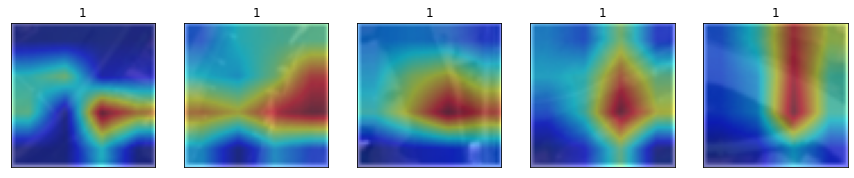

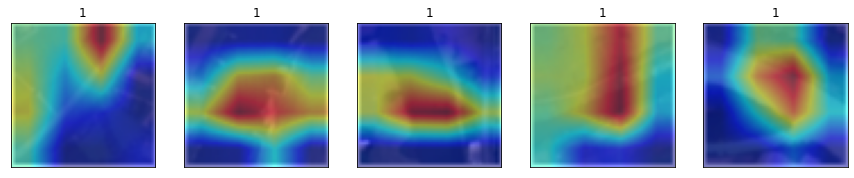

In [60]:
explainer = GradCAM(
    model=ccpl_resnet18_model_1,
    target_layer=ccpl_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_7.png")

explainer = GradCAM(
    model=ccpl_resnet18_model_2,
    target_layer=ccpl_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_8.png")

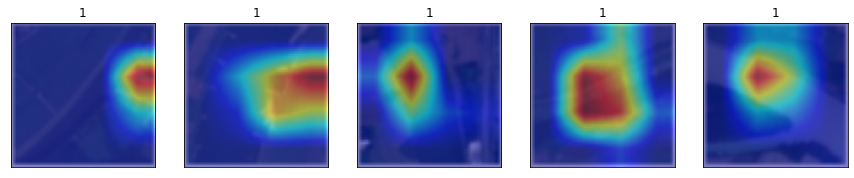

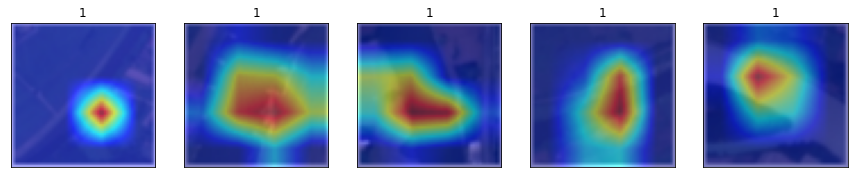

In [61]:
explainer = GradCAM(
    model=dcgan_fda_resnet18_model_1,
    target_layer=dcgan_fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_9.png")

explainer = GradCAM(
    model=dcgan_fda_resnet18_model_2,
    target_layer=dcgan_fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_10.png")

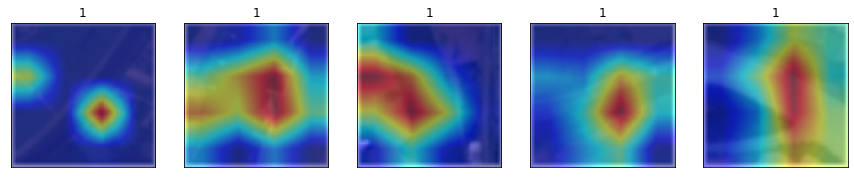

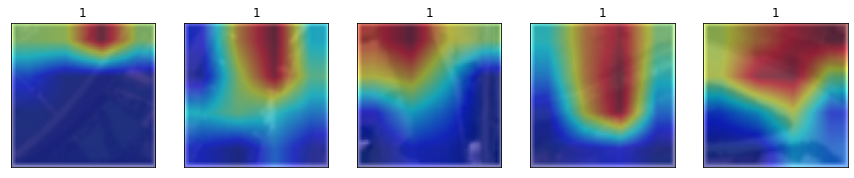

In [62]:
explainer = GradCAM(
    model=dcgan_flow_resnet18_model_1,
    target_layer=dcgan_flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_11.png")

explainer = GradCAM(
    model=dcgan_flow_resnet18_model_2,
    target_layer=dcgan_flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_12.png")

### GAN + NST

In [63]:
rv_resnet18_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/GAN_NST/ResNet18"

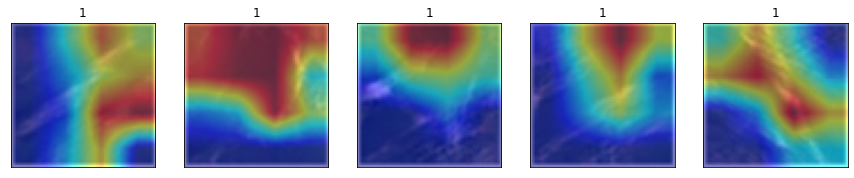

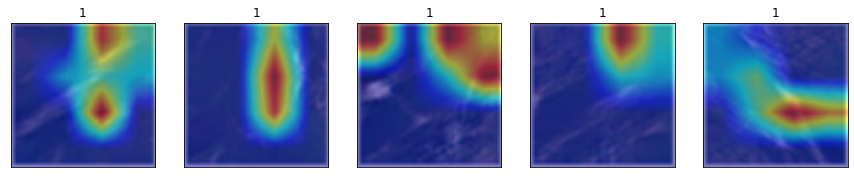

In [64]:
explainer = GradCAM(
    model=baseline_resnet18_model_1,
    target_layer=baseline_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_1.png")

explainer = GradCAM(
    model=baseline_resnet18_model_2,
    target_layer=baseline_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_2.png")

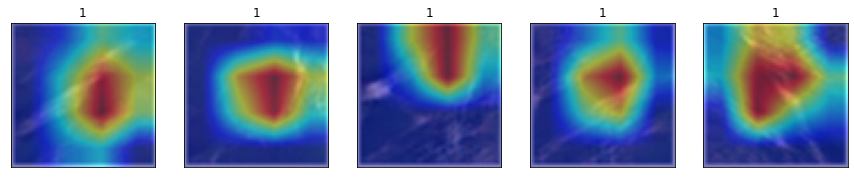

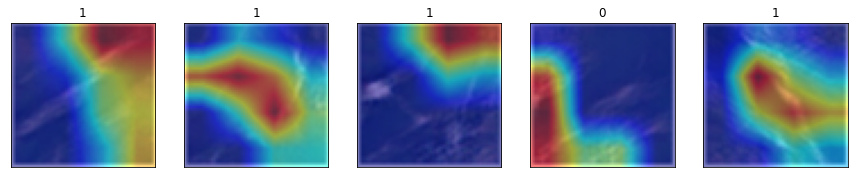

In [65]:
explainer = GradCAM(
    model=fda_resnet18_model_1,
    target_layer=fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_3.png")

explainer = GradCAM(
    model=fda_resnet18_model_2,
    target_layer=fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_4.png")

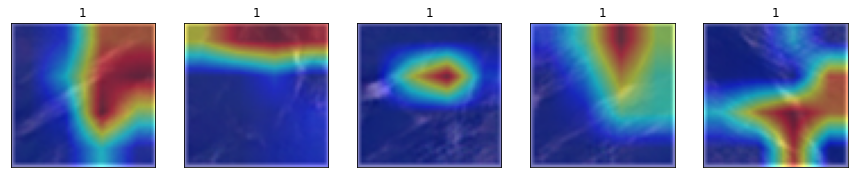

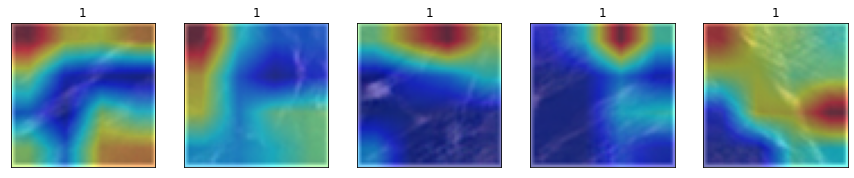

In [66]:
explainer = GradCAM(
    model=flow_resnet18_model_1,
    target_layer=flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_5.png")

explainer = GradCAM(
    model=flow_resnet18_model_2,
    target_layer=flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_6.png")

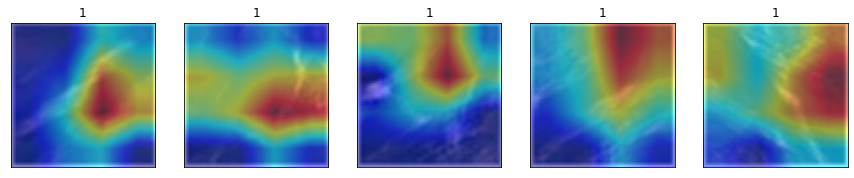

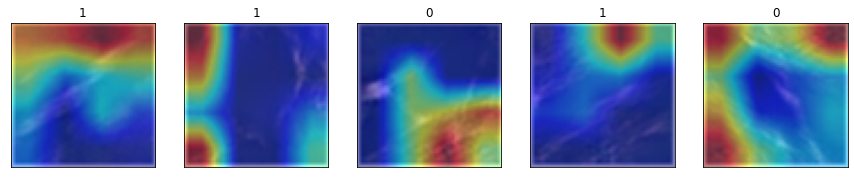

In [67]:
explainer = GradCAM(
    model=ccpl_resnet18_model_1,
    target_layer=ccpl_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_7.png")

explainer = GradCAM(
    model=ccpl_resnet18_model_2,
    target_layer=ccpl_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_8.png")

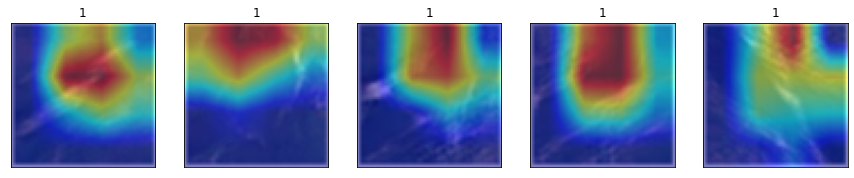

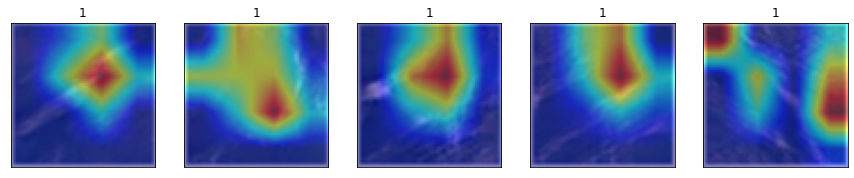

In [68]:
explainer = GradCAM(
    model=dcgan_fda_resnet18_model_1,
    target_layer=dcgan_fda_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_9.png")

explainer = GradCAM(
    model=dcgan_fda_resnet18_model_2,
    target_layer=dcgan_fda_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_10.png")

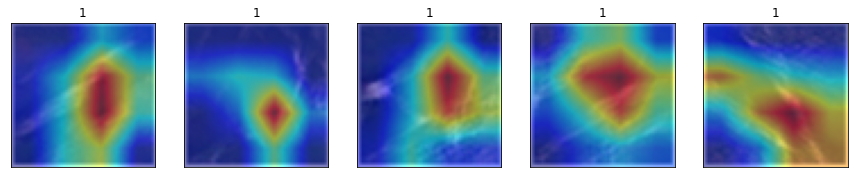

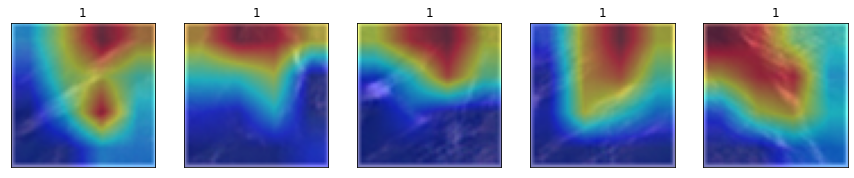

In [69]:
explainer = GradCAM(
    model=dcgan_flow_resnet18_model_1,
    target_layer=dcgan_flow_resnet18_model_1.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_11.png")

explainer = GradCAM(
    model=dcgan_flow_resnet18_model_2,
    target_layer=dcgan_flow_resnet18_model_2.extractor[-3][0],
    preprocess_function=preprocess
)

explanations = explainer.explain(rv_gan_nst)
explanations.plot(save_path=f"{rv_resnet18_path}/GradCAM/res_12.png")